# Chicago Burglaries
#### By Annivas Exarchos

## Introduction
**The overall objective of this project will be to analyze burglary data for Chicago, IL from 2015 to 2019.**

**Throughout this tutorial, we will attempt to find when and where burglaries are most likely to take place, while also complementing our analysis with interesting burglary trends and statistics.**

## Table of Contents
- [Required Tools](#Required-Tools)
- [Installations & Imports](#Installations-&-Imports)
- [Data Collection](#1.-Data-Collection)
- [Data Processing](#2.-Data-Processing)
- [Exploratory Data Analysis & Visualization](#3.-Exploratory-Data-Analysis-&-Visualization)
- [Insight & Observations](#4.-Insight-&-Observations)

## Required Tools

This project is written in [python 3.91](https://docs.python.org/3/).

You will need the following libraries:
- [pandas](https://pandas.pydata.org/docs/)
- [numpy](https://numpy.org/doc/)
- [matplotlib.pyplot](https://matplotlib.org/api/pyplot_api.html)
- [folium](https://python-visualization.github.io/folium/)
- [sodapy](https://github.com/xmunoz/sodapy)

## Installations & Imports

In [498]:
!pip install folium # install to create maps

In [558]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import folium
from sodapy import Socrata
from folium.plugins import HeatMap

## 1. Data Collection
This is the first stage of the data lifecycle. Here, we will collect all the data that we will need for our project.

The main [dataset](https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2) that we will be using contains all reported crimes in the city of Chicago since 2001 and can be found in the official [Chicago Data Portal](https://data.cityofchicago.org/).

The data is stored in a large csv file, which we will be accessing using the [sodapy](https://github.com/xmunoz/sodapy) client through the [Socrata Open Data API](https://dev.socrata.com/).

From this file we will only extract crime data for the years 2015-2019.

In [738]:
# These can be found in the data portal
domain = 'data.cityofchicago.org'
dataset_id = 'ijzp-q8t2'

# Generate token by creating an account for the data portal
token = 'Lkysyak9elTtcNXRVmfsj9YLX'

client = Socrata(domain, token)

# Get data for 2015-2019
results = client.get(dataset_id, where="date >= '2015-01-01' and date < '2020-01-01'", limit=2000000)

# Store into pandas dataframe
crime_table = pd.DataFrame.from_dict(results)

# Display first 5 rows of dataframe
crime_table.head()

,id,case_number,date,block,iucr,primary_type,description,location_description,arrest,domestic,...,ward,community_area,fbi_code,year,updated_on,x_coordinate,y_coordinate,latitude,longitude,location
0,11768614,JC361321,2015-01-01T00:00:00.000,030XX W 41ST ST,1751,OFFENSE INVOLVING CHILDREN,CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,APARTMENT,True,True,...,12,58,17,2015,2020-11-26T15:46:07.000,NaN,NaN,NaN,NaN,NaN
1,12179862,JD383609,2015-01-01T00:00:00.000,064XX S CARPENTER ST,1754,OFFENSE INVOLVING CHILDREN,AGGRAVATED SEXUAL ASSAULT OF CHILD BY FAMILY M...,APARTMENT,False,False,...,16,68,02,2015,2020-09-30T15:52:35.000,NaN,NaN,NaN,NaN,NaN
2,12179870,JD383623,2015-01-01T00:00:00.000,052XX S WOOD ST,1754,OFFENSE INVOLVING CHILDREN,AGGRAVATED SEXUAL ASSAULT OF CHILD BY FAMILY M...,RESIDENCE,False,False,...,16,61,02,2015,2020-09-30T15:52:35.000,NaN,NaN,NaN,NaN,NaN
3,10135798,HY324366,2015-01-01T00:00:00.000,051XX W MONTANA ST,0266,CRIMINAL SEXUAL ASSAULT,PREDATORY,RESIDENCE,False,True,...,31,19,02,2015,2020-08-29T15:47:37.000,1141746,1915820,41.925078599,-87.754584486,"{'latitude': '41.925078599', 'longitude': '-87..."
4,12056114,JD238384,2015-01-01T00:00:00.000,062XX S INDIANA AVE,1752,OFFENSE INVOLVING CHILDREN,AGGRAVATED CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,RESIDENCE,True,True,...,20,40,17,2015,2020-08-28T15:49:20.000,1185674,1871645,41.802933396,-87.594571086,"{'latitude': '41.802933396', 'longitude': '-87..."


Additionally, we will be using some [data](https://crime-data-explorer.fr.cloud.gov/explorer/national/united-states/crime) downloaded from FBI's [Crime Data Explorer](https://crime-data-explorer.fr.cloud.gov/) in csv format.
These burglary-specific datasets include statistics about victims' and offenders' age, sex, and race, as well the relationship between victims and offenders and other crimes that burglary offenders have been charged with.

To import this data into dataframes, we will be using pandas' [read_csv](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html) method.

In [697]:
# Burglary offenders by age
offender_age = pd.read_csv("https://annivas.github.io/files/offender-age-2015-2019.csv")
offender_age

,Key,Value
0,0-9,4041
1,10-19,182462
2,20-29,306174
3,30-39,231868
4,40-49,104887
5,50-59,69272
6,60-69,10986
7,70-79,1744
8,80-89,496
9,90-Older,2269


In [698]:
# Burglary offenders by sex
offender_sex = pd.read_csv("https://annivas.github.io/files/offender-sex-2015-2019.csv")
offender_sex

,Key,Value,Percent
0,Male,799186,0.548295
1,Female,185725,0.127420
2,Unknown,472674,0.324286


In [699]:
# Burglary offenders by race
offender_race = pd.read_csv("https://annivas.github.io/files/offender-race-2015-2019.csv")
offender_race

,Key,Value
0,Asian,6421
1,Native Hawaiian,0
2,Black or African American,293696
3,American Indian or Alaska Native,10945
4,White,618786
5,Unknown,526479


In [700]:
# Burglary victims by age
victim_age = pd.read_csv("https://annivas.github.io/files/victim-age-2015-2019.csv")
victim_age

,Key,Value
0,0-9,7600
1,10-19,70293
2,20-29,427706
3,30-39,442191
4,40-49,375548
5,50-59,370236
6,60-69,266728
7,70-79,130137
8,80-89,47165
9,90-Older,9419


In [701]:
# Burglary victims by sex
victim_sex = pd.read_csv("https://annivas.github.io/files/victim-sex-2015-2019.csv")
victim_sex

,Key,Value,Percent
0,Male,1164541,0.535024
1,Female,996356,0.457755
2,Unknown,15716,0.007220


In [702]:
# Burglary victims by race
victim_race = pd.read_csv("https://annivas.github.io/files/victim-race-2015-2019.csv")
victim_race

,Key,Value
0,Asian,41819
1,Native Hawaiian,0
2,Black or African American,413438
3,American Indian or Alaska Native,10844
4,White,1607281
5,Unknown,99278


In [739]:
# Relationship between burglary offenders and victims
victim_offender_relationship = pd.read_csv("https://annivas.github.io/files/victim-offender-relationship-2015-2019.csv")
victim_offender_relationship

,Key,Value
0,Acquaintance,19045
1,Babysittee,45
2,Boyfriend/Girlfriend,13371
3,Child of Boyfriend/Girlfriend,190
4,Child,454
5,Employee,134
6,Employer,216
7,Friend,2814
8,Grandchild,14
9,Grandparent,388


In [740]:
# Other offenses linked to burglary offenders
linked_offenses = pd.read_csv("https://annivas.github.io/files/offense-linked-to-another-offense-2015-2019.csv")
linked_offenses

,Key,Value
0,Identity Theft,1147
1,Fondling,982
2,Bribery,982
3,Stolen Property Offenses,12711
4,Pocket-Picking,340
5,Murder and Nonnegligent Manslaughter,344
6,Welfare Fraud,21
7,Extortion/Blackmail,109
8,Theft from Coin-operated Machine or Device,889
9,Statutory Rape,31


## 2. Data Processing
Now that we have collected all the necessary data, it's time to process it and organize it in a way that will serve our needs for the remainder of the project.

First, let's extract all burglaries from the crime table into a new table. While doing this, we will only choose the the columns that we will need and we will also rename the "date" column to "datetime". This is done because the column currently contains dates and times, and we will be creating separate "date" and "time" columns in the following steps.

In [758]:
# Get burglaries from crime table (only the columns we need)
burglary_table = crime_table[['id', 'primary_type', 'description', 'arrest', 'location', 'latitude', 'longitude', 'date', 'year']].loc[crime_table['primary_type']=='BURGLARY']
# Rename date to datetime
burglary_table = burglary_table.rename(columns={"date":"datetime"})
# Display first 5 rows
burglary_table.head()

,id,primary_type,description,arrest,location,latitude,longitude,datetime,year
328,9913600,BURGLARY,UNLAWFUL ENTRY,False,"{'latitude': '41.975141744', 'longitude': '-87...",41.975141744,-87.76454628,2015-01-01T00:01:00.000,2015
388,9911420,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.882806623', 'longitude': '-87...",41.882806623,-87.705030858,2015-01-01T01:00:00.000,2015
446,9911551,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.901003465', 'longitude': '-87...",41.901003465,-87.649282987,2015-01-01T02:00:00.000,2015
451,9914392,BURGLARY,UNLAWFUL ENTRY,False,"{'latitude': '41.873236088', 'longitude': '-87...",41.873236088,-87.740923693,2015-01-01T02:00:00.000,2015
581,9911384,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.996215265', 'longitude': '-87...",41.996215265,-87.716862144,2015-01-01T04:50:00.000,2015


Now that we have only the data we need, let's add some new columns deriving from the "datetime" column

In [742]:
# Create month column. Months are represented as ints from 1 (January) to 12 (December).
# We could represent months as strings, but integers facilitate plotting.
burglary_table['month'] = pd.DatetimeIndex(burglary_table['datetime']).month
# Display first 5 rows
burglary_table.head()

,id,primary_type,description,arrest,latitude,longitude,datetime,year,month
328,9913600,BURGLARY,UNLAWFUL ENTRY,False,41.975141744,-87.76454628,2015-01-01T00:01:00.000,2015,1
388,9911420,BURGLARY,FORCIBLE ENTRY,False,41.882806623,-87.705030858,2015-01-01T01:00:00.000,2015,1
446,9911551,BURGLARY,FORCIBLE ENTRY,False,41.901003465,-87.649282987,2015-01-01T02:00:00.000,2015,1
451,9914392,BURGLARY,UNLAWFUL ENTRY,False,41.873236088,-87.740923693,2015-01-01T02:00:00.000,2015,1
581,9911384,BURGLARY,FORCIBLE ENTRY,False,41.996215265,-87.716862144,2015-01-01T04:50:00.000,2015,1


In [743]:
# Create date column
burglary_table['date'] = pd.DatetimeIndex(burglary_table['datetime']).date
# Display first 5 rows
burglary_table.head()

,id,primary_type,description,arrest,latitude,longitude,datetime,year,month,date
328,9913600,BURGLARY,UNLAWFUL ENTRY,False,41.975141744,-87.76454628,2015-01-01T00:01:00.000,2015,1,2015-01-01
388,9911420,BURGLARY,FORCIBLE ENTRY,False,41.882806623,-87.705030858,2015-01-01T01:00:00.000,2015,1,2015-01-01
446,9911551,BURGLARY,FORCIBLE ENTRY,False,41.901003465,-87.649282987,2015-01-01T02:00:00.000,2015,1,2015-01-01
451,9914392,BURGLARY,UNLAWFUL ENTRY,False,41.873236088,-87.740923693,2015-01-01T02:00:00.000,2015,1,2015-01-01
581,9911384,BURGLARY,FORCIBLE ENTRY,False,41.996215265,-87.716862144,2015-01-01T04:50:00.000,2015,1,2015-01-01


In [744]:
# Create hour column. Hours are represented as ints from 0 (12 am) to 23 (11 pm)
burglary_table['hour'] = pd.DatetimeIndex(burglary_table['datetime']).hour
# Display first 5 rows
burglary_table.head()

,id,primary_type,description,arrest,latitude,longitude,datetime,year,month,date,hour
328,9913600,BURGLARY,UNLAWFUL ENTRY,False,41.975141744,-87.76454628,2015-01-01T00:01:00.000,2015,1,2015-01-01,0
388,9911420,BURGLARY,FORCIBLE ENTRY,False,41.882806623,-87.705030858,2015-01-01T01:00:00.000,2015,1,2015-01-01,1
446,9911551,BURGLARY,FORCIBLE ENTRY,False,41.901003465,-87.649282987,2015-01-01T02:00:00.000,2015,1,2015-01-01,2
451,9914392,BURGLARY,UNLAWFUL ENTRY,False,41.873236088,-87.740923693,2015-01-01T02:00:00.000,2015,1,2015-01-01,2
581,9911384,BURGLARY,FORCIBLE ENTRY,False,41.996215265,-87.716862144,2015-01-01T04:50:00.000,2015,1,2015-01-01,4


In [710]:
# Create time column
burglary_table['time'] = pd.DatetimeIndex(burglary_table['datetime']).time
# Display first 5 rows
burglary_table.head()

,id,primary_type,description,arrest,latitude,longitude,datetime,year,month,date,hour,time
291,9913600,BURGLARY,UNLAWFUL ENTRY,False,41.975141744,-87.76454628,2015-01-01T00:01:00.000,2015,1,2015-01-01,0,00:01:00
388,9911420,BURGLARY,FORCIBLE ENTRY,False,41.882806623,-87.705030858,2015-01-01T01:00:00.000,2015,1,2015-01-01,1,01:00:00
446,9911551,BURGLARY,FORCIBLE ENTRY,False,41.901003465,-87.649282987,2015-01-01T02:00:00.000,2015,1,2015-01-01,2,02:00:00
451,9914392,BURGLARY,UNLAWFUL ENTRY,False,41.873236088,-87.740923693,2015-01-01T02:00:00.000,2015,1,2015-01-01,2,02:00:00
581,9911384,BURGLARY,FORCIBLE ENTRY,False,41.996215265,-87.716862144,2015-01-01T04:50:00.000,2015,1,2015-01-01,4,04:50:00


In [745]:
# Create day_of_week column. Days are represented as ints from 0 (Monday) to 6 (Sunday).
# We could represent days as strings, but integers facilitate plotting.
burglary_table['day_of_week'] = pd.DatetimeIndex(burglary_table['datetime']).weekday
# Display first 5 rows
burglary_table.head()

,id,primary_type,description,arrest,latitude,longitude,datetime,year,month,date,hour,day_of_week
328,9913600,BURGLARY,UNLAWFUL ENTRY,False,41.975141744,-87.76454628,2015-01-01T00:01:00.000,2015,1,2015-01-01,0,3
388,9911420,BURGLARY,FORCIBLE ENTRY,False,41.882806623,-87.705030858,2015-01-01T01:00:00.000,2015,1,2015-01-01,1,3
446,9911551,BURGLARY,FORCIBLE ENTRY,False,41.901003465,-87.649282987,2015-01-01T02:00:00.000,2015,1,2015-01-01,2,3
451,9914392,BURGLARY,UNLAWFUL ENTRY,False,41.873236088,-87.740923693,2015-01-01T02:00:00.000,2015,1,2015-01-01,2,3
581,9911384,BURGLARY,FORCIBLE ENTRY,False,41.996215265,-87.716862144,2015-01-01T04:50:00.000,2015,1,2015-01-01,4,3


For the complementary data we imported, the only processing that needs to be done is setting the "Key" column as the index of each table to facilitate plotting.

In [713]:
offender_age = offender_age.set_index('Key')
offender_sex = offender_sex.set_index('Key')
offender_race = offender_race.set_index('Key')
victim_age = victim_age.set_index('Key')
victim_sex = victim_sex.set_index('Key')
victim_race = victim_race.set_index('Key')
victim_offender_relationship = victim_offender_relationship.set_index('Key')
linked_offenses = linked_offenses.set_index('Key')

## 3. Exploratory Data Analysis & Visualization
Now that our data is clean and organized, it's time to analyze it through the use of visualizations. This is usually the most interesting part of the data lifecycle, as we will attempt to plot our data and observe possible trends.

First, we will use the original crime table to measure the occurrences of each type of crime in the last 5 years.

In [746]:
# Caluculate number of each crime type occurrence in crime_table
crime_type_occ = crime_table['primary_type'].value_counts()
crime_type_occ

THEFT                                311036
BATTERY                              247752
CRIMINAL DAMAGE                      143240
ASSAULT                               96110
DECEPTIVE PRACTICE                    93090
OTHER OFFENSE                         86117
NARCOTICS                             77579
BURGLARY                              61849
MOTOR VEHICLE THEFT                   51699
ROBBERY                               51149
CRIMINAL TRESPASS                     33247
WEAPONS VIOLATION                     23295
OFFENSE INVOLVING CHILDREN            11653
PUBLIC PEACE VIOLATION                 8419
CRIM SEXUAL ASSAULT                    6894
INTERFERENCE WITH PUBLIC OFFICER       6183
SEX OFFENSE                            5534
PROSTITUTION                           4255
HOMICIDE                               3068
ARSON                                  2161
LIQUOR LAW VIOLATION                   1210
CRIMINAL SEXUAL ASSAULT                1036
GAMBLING                        

From the above data, theft looks to be the most common crime in Chicago, while burglary is 8th.

Now, let's plot the 12 most common types of crime in a pie chart to get a better idea.

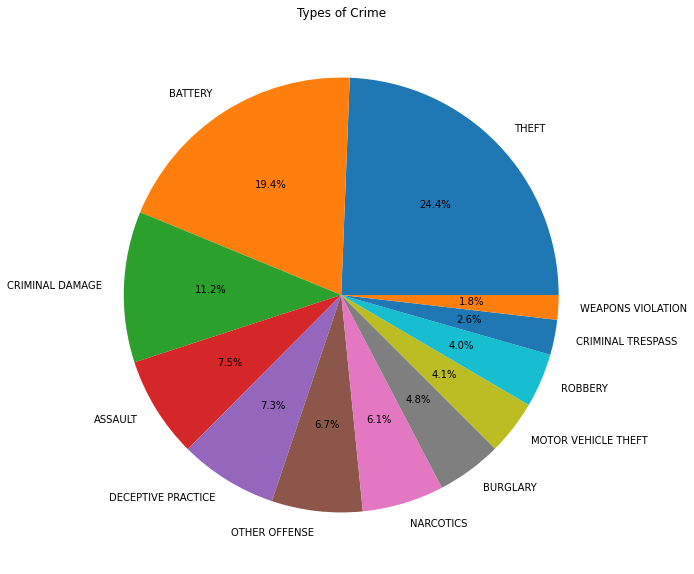

In [747]:
crime_type_occ[0:12].plot(kind='pie', figsize=(10, 10), title="Types of Crime", autopct='%1.1f%%')
plt.ylabel("")
plt.show()

By using the burglary_table, we can plot the number of burglaries by year and hopefully observe a trend.

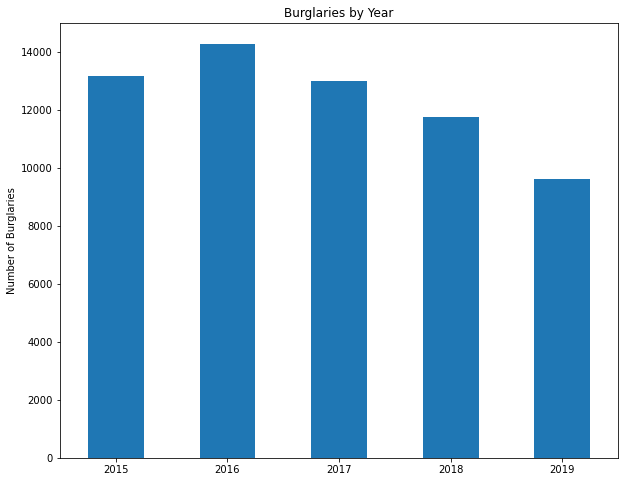

In [715]:
burglary_table['year'].value_counts().sort_index().plot(kind='bar', rot=0, title="Burglaries by Year", figsize=(10, 8))
plt.ylabel("Number of Burglaries")
plt.show()

From the above bar plot, we can tell that in the last 5 years, 2016 had the most burglaries. Most importantly, there seems to be a decreasing trend, meaning that the number of burglaries mostly decreases every year.

Now let's try to visualize burglaries by month. By counting the occurrences of each month in our burglary table, we can get the average number of burglaries occurred by month throughout the last 5 years.

In [748]:
# Total number of burglaries for 5 years, grouped by month
burglaries_by_month = burglary_table['month'].value_counts().sort_index()
# Divide value for each month by 5 to get normalized number of burglaries per month
burglaries_by_month = burglaries_by_month.apply(lambda x: x/5)
burglaries_by_month

1     1053.8
2      777.2
3      865.0
4      895.4
5     1006.2
6     1030.6
7     1156.0
8     1178.2
9     1103.8
10    1135.8
11    1076.4
12    1091.4
Name: month, dtype: float64

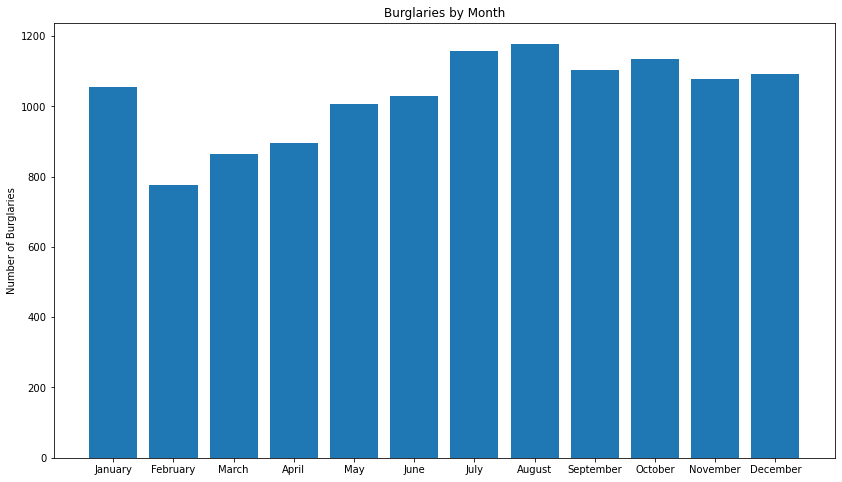

In [749]:
figure(num=None, figsize=(14, 8))
x = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
y = burglaries_by_month
plt.bar(x,y)
plt.title("Burglaries by Month")
plt.ylabel("Number of Burglaries")
plt.show()

After plotting the average number of burglaries per month, we can start observing some trends. The most burglaries occur in August (a little less than 1200), followed by July, which could be attributed to the fact that many homes are left unoccupied during summer vacations. February seems to have the lowest average number of burglaries (about 2/3 of August's burglaries), meaning that households are the safest during that month of the year.

We can also plot the number of burglaries by day of the week.

In [750]:
# Total number of burglaries for 5 years, grouped by day of week
burglaries_by_day_of_week = burglary_table['day_of_week'].value_counts().sort_index()
# Divide value for each day by 5 to get number of burglaries for each year by day
burglaries_by_day_of_week = burglaries_by_day_of_week.apply(lambda x: x/5)
# Divide value for each day by 52.1429 (number of weeks in a year) to get normalized number of burglaries by day of week
burglaries_by_day_of_week = burglaries_by_day_of_week.apply(lambda x: x/52.1429)
burglaries_by_day_of_week

0    36.165998
1    35.279971
2    35.475587
3    35.126546
4    37.454764
5    30.504632
6    27.221347
Name: day_of_week, dtype: float64

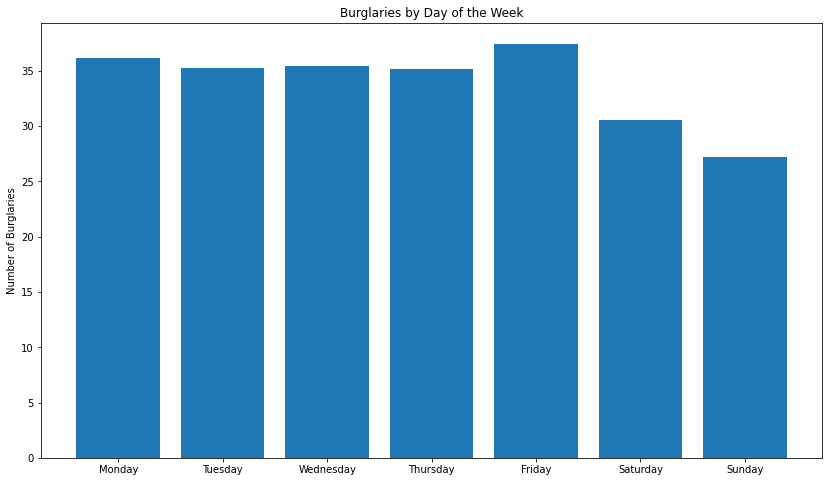

In [751]:
figure(num=None, figsize=(14, 8))
x = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
y = burglaries_by_day_of_week
plt.bar(x,y)
plt.title("Burglaries by Day of the Week")
plt.ylabel("Number of Burglaries")
plt.show()

There seem to be about 35 burglaries per weekday in Chicago, while the number is lower on weekends.

Now let's dive a step deeper, and plot the number of burglaries by time of the day.

In [752]:
# Total number of burglaries for 5 years, grouped by hour in the day
burglaries_by_time = burglary_table['hour'].value_counts().sort_index()
# Divide value for each hour by 5 to get number of burglaries for each year per hour
burglaries_by_time = burglaries_by_time.apply(lambda x: x/5)
# Divide value for each day by 8760 (number of hours in a year) to get normalized number of burglaries by time
burglaries_by_time = burglaries_by_time.apply(lambda x: x/8760)
burglaries_by_time

0     0.056233
1     0.035913
2     0.035228
3     0.037329
4     0.035571
5     0.038836
6     0.045297
7     0.068311
8     0.083174
9     0.083059
10    0.073539
11    0.065251
12    0.084384
13    0.062945
14    0.069749
15    0.071963
16    0.064886
17    0.071210
18    0.066872
19    0.059132
20    0.053447
21    0.052100
22    0.054749
23    0.042900
Name: hour, dtype: float64

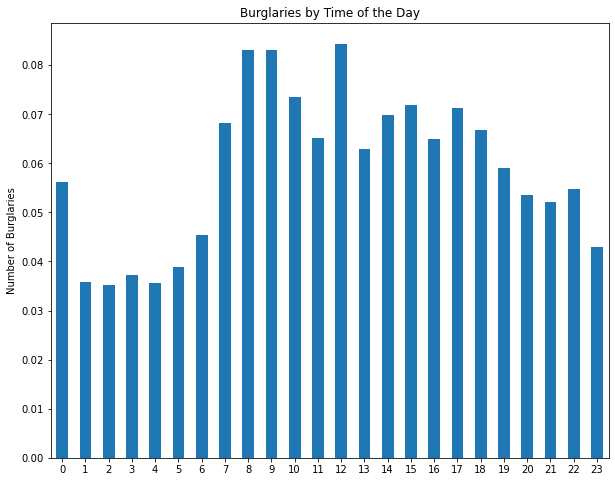

In [753]:
burglaries_by_time.plot(kind='bar', rot=0, title="Burglaries by Time of the Day", figsize=(10, 8))
plt.ylabel("Number of Burglaries")
plt.show()

It might be expected that most burglaries occur at nightime. However, according to the above bar plot, most burglaries in Chicago occur around 8am, 9am, and 12pm. In fact, almost one burglary occurs at these times every day. Burglaries are least likely to occur from 1am to 6am.

These observations seem interesting. Let's also visualize them in a line plot.

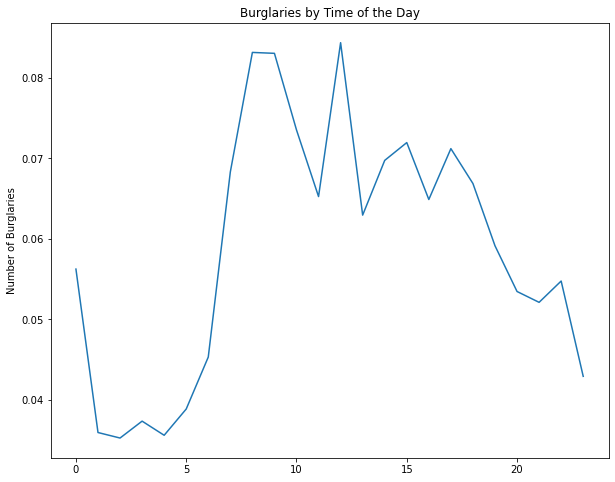

In [754]:
burglaries_by_time.plot(rot=0, title="Burglaries by Time of the Day", figsize=(10, 8))
plt.ylabel("Number of Burglaries")
plt.show()

This line plot confirms the observations from our bar plot and shows the big difference in burglary occurrence between different times of the day.

Now that we have determined when burglaries are most likely to occur, let's observe where they are most likely to occur.

We will do this by creating an interactive heat map indicating the areas of Chicago with the highest concentration of burglaries.

The burglary table contains a very large number of datapoints, which would make our heatmap ugly and unreadable.
To improve readability and accuracy, we will be using a sample of size 10,000.

In [759]:
# Take sample of 10,000 rows
sample_table = burglary_table.sample(n=10000)
# Display first 5 rows
sample_table.head()

,id,primary_type,description,arrest,location,latitude,longitude,datetime,year
590461,10891236,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.678997924', 'longitude': '-87...",41.678997924,-87.646818138,2017-03-24T12:30:00.000,2017
940350,11379007,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.736651062', 'longitude': '-87...",41.736651062,-87.55556692,2018-07-11T09:00:00.000,2018
447228,10668607,BURGLARY,UNLAWFUL ENTRY,False,"{'latitude': '41.857773474', 'longitude': '-87...",41.857773474,-87.667510615,2016-09-04T03:45:00.000,2016
285524,10399690,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.813256103', 'longitude': '-87...",41.813256103,-87.695582945,2016-02-01T11:20:00.000,2016
584118,10878075,BURGLARY,FORCIBLE ENTRY,False,"{'latitude': '41.765286035', 'longitude': '-87...",41.765286035,-87.577086035,2017-03-14T17:00:00.000,2017


To map our sample, we will be using the folium package

In [761]:
# Create map
map_osm = folium.Map(location=[41.88, -87.63], zoom_start=11)
# Drop rows where location is missing
heat_table = sample_table[sample_table['location'].notna()]
# Get heat data from sample
heat_data = [[row['latitude'], row['longitude']] for index, row in heat_table.iterrows()]
# Create heat map
HeatMap(heat_data, radius=20).add_to(map_osm)
    
map_osm

Now let's make our map a bit more descriptive, by adding some more data.

We will be creating circles, indicating the location of each burglary. By clicking on the circles, one will be able to see the incident description. Additionally, green circles will indicate burglaries where the offender has been arrested, while black circles will mean that the offender has not been arrested.

In [763]:
# Add circles
for index, row in heat_table.iterrows():
    color=''
    if row['arrest'] == True:
        color = 'green'
    else:
        color = 'black'
        
    folium.Circle(
    radius = 20,
    location = [row['latitude'], row['longitude']],
    popup = row['description'],
    color = color,
    fill = True,
).add_to(map_osm)
    
map_osm

Now let's plot some other interesting statistics, using our complementary datasets.

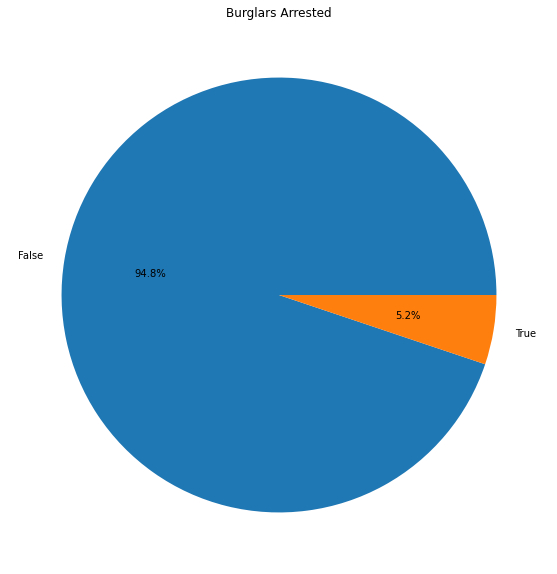

In [723]:
burglary_table['arrest'].value_counts().plot(kind='pie', figsize=(10, 10), title="Burglars Arrested", autopct='%1.1f%%')
plt.ylabel("")
plt.show()

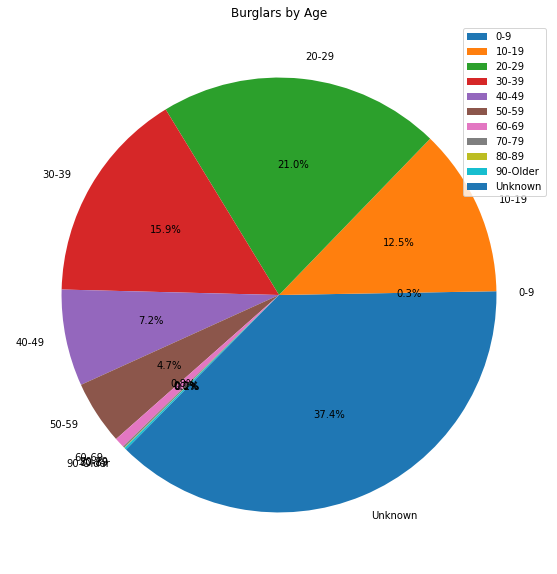

In [724]:
offender_age.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Burglars by Age")
plt.ylabel("")
plt.show()

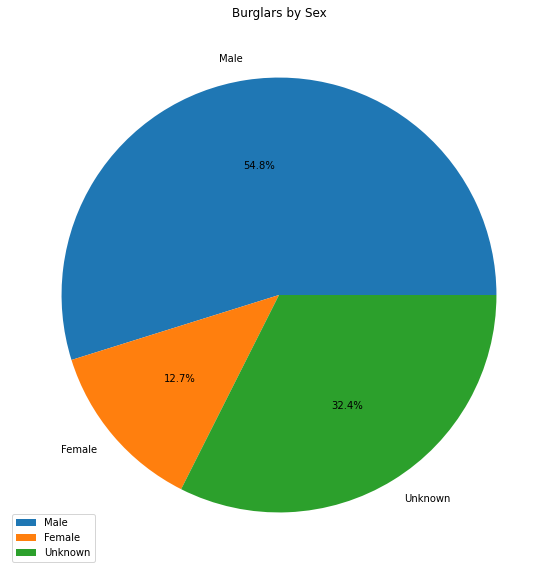

In [725]:
offender_sex.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Burglars by Sex")
plt.ylabel("")
plt.show()

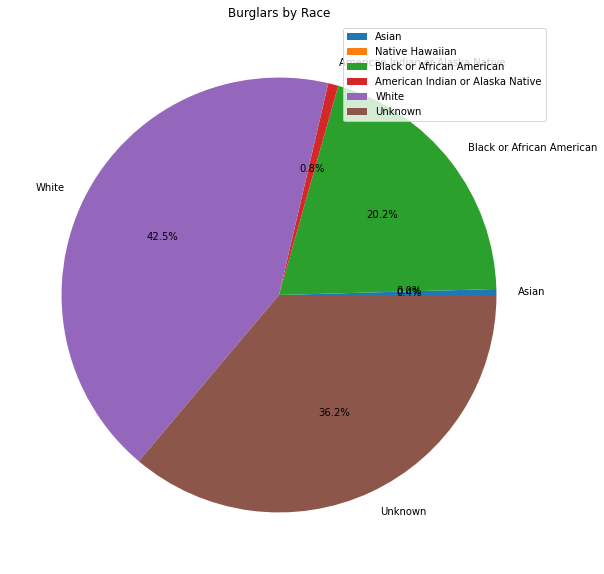

In [726]:
offender_race.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Burglars by Race")
plt.ylabel("")
plt.show()

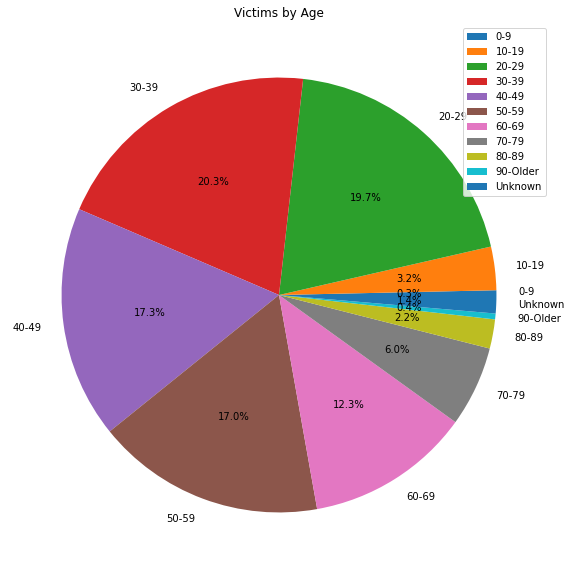

In [727]:
victim_age.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Victims by Age")
plt.ylabel("")
plt.show()

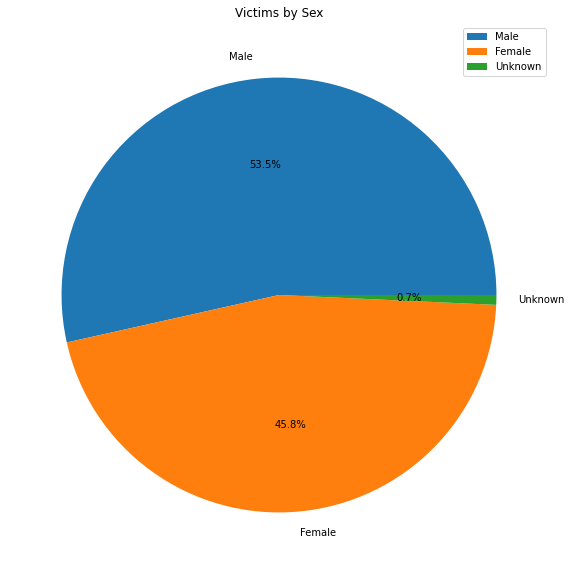

In [728]:
victim_sex.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Victims by Sex")
plt.ylabel("")
plt.show()

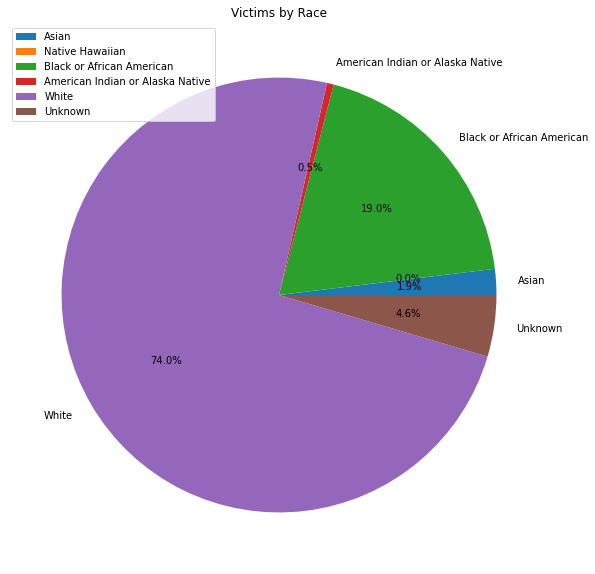

In [729]:
victim_race.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Victims by Race")
plt.ylabel("")
plt.show()

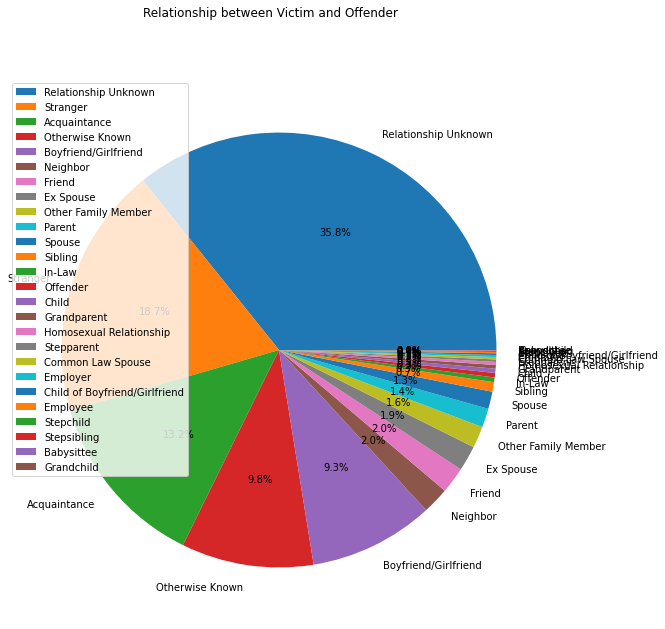

In [736]:
victim_offender_relationship.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Relationship between Victim and Offender", subplots=True)
plt.ylabel("")
plt.show()

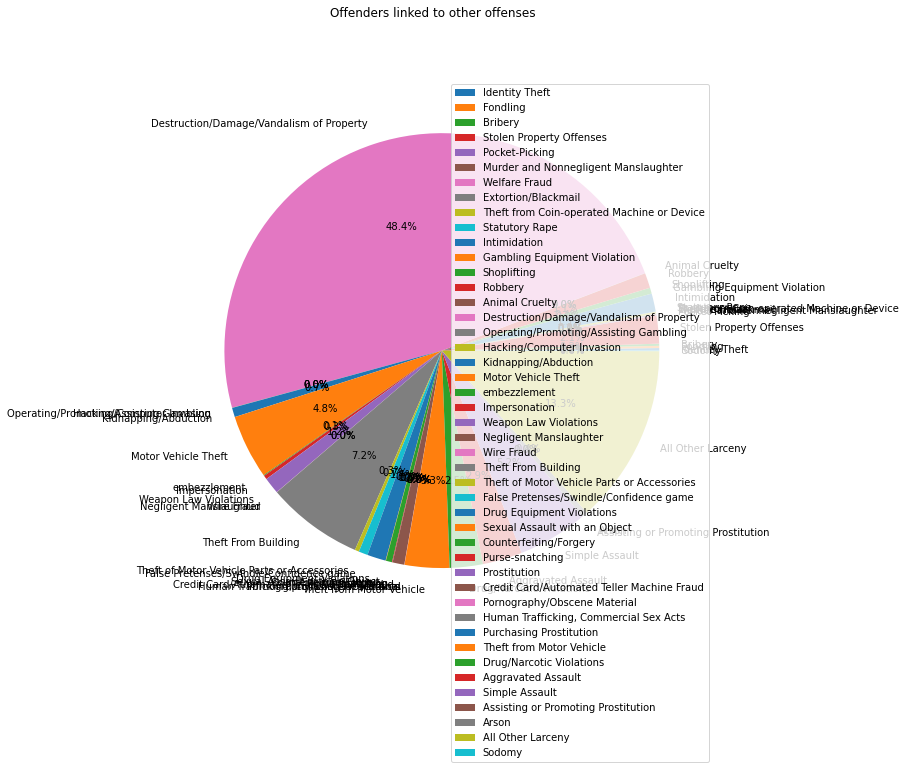

In [735]:
linked_offenses.plot(kind='pie', y='Value', figsize=(10,10), autopct='%1.1f%%', title="Offenders linked to other offenses", subplots=True)
plt.ylabel("")
plt.show()

## 4. Insight & Observations

For the last stage of the data lifecycle, we will be utilizing the analysis we conducted to derive some insights and observations about burglaries in Chicago.

The number of burglaries seems to be decreasing every year, meaning that Chicago is becoming a safer place to live. Most burglaries occur in the summer months, on weekdays, between 8am and 12pm.

The highest concentration of burglaries seems to be in the center of the city.

The majority of burglars are white males between the ages 20-29 and never get arrested.

A considerable amount of burglary victims seems to know the burglar in some way.